# Import and settings

In [1]:
%load_ext autoreload
%autoreload 2

from time import localtime, strftime
import os, re, gc, joblib
import numpy as np
import numpy_groupies as npg
import pandas as pd

import anndata
import scanpy as sc
import sctk as sk

import matplotlib.pyplot as plt
from matplotlib import rcParams
from matplotlib.colors import ListedColormap
import seaborn as sn
import plotnine as pln

In [2]:
np.set_printoptions(linewidth=150)

rcParams["pdf.fonttype"] = 42
rcParams["ps.fonttype"] = 42

sc.settings.verbosity = 0
expr_cmap = sk.expression_colormap()
sk.set_figsize((4, 4))

In [3]:
def timestamp(date_only=True):
    stamp_format = "%Y%m%d" if date_only else "%Y%m%d-%H%M"
    return strftime(stamp_format, localtime())

In [4]:
def get_reaction_consistencies(compass_reaction_penalties, min_range=1e-3):
    """
    Converts the raw penalties outputs of compass into scores per reactions where higher numbers indicate more activity
    """
    df = -np.log(compass_reaction_penalties + 1)
    df = df[df.max(axis=1) - df.min(axis=1) >= min_range]
    df = df - df.min().min()
    return df

# Load data

In [5]:
cell_md = pd.read_csv('/nfs/team205/heart/compass/fetal_allCM/cell_metadata.csv', index_col = 0)
micropools = pd.read_csv('/nfs/team205/heart/compass/fetal_allCM/out/micropools.tsv', index_col = 0, sep ='\t')
micropool_md = pd.read_csv('/nfs/team205/heart/compass/fetal_allCM/cluster_metadata.csv', index_col = 0)

In [6]:
# this is a reference file - not specific to each run of Compass
reaction_metadata = pd.read_csv("/home/jovyan/COMPASSResources/reaction_metadata.csv", index_col = 0)
reaction_metadata

,reaction_name,formula,associated_genes,subsystem,EC_number,confidence
reaction_no_direction,,,,,,
10FTHF5GLUtl,"5-glutamyl-10FTHF transport, lysosomal",1.00 * 10-formyltetrahydrofolate-[Glu](5) [c] ...,NaN,"Transport, lysosomal",NaN,2.0
10FTHF5GLUtm,"5-glutamyl-10FTHF transport, mitochondrial",1.00 * 10-formyltetrahydrofolate-[Glu](5) [m] ...,NaN,"Transport, mitochondrial",NaN,2.0
10FTHF6GLUtl,"6-glutamyl-10FTHF transport, lysosomal",1.00 * 10-formyltetrahydrofolate-[Glu](6) [c] ...,NaN,"Transport, lysosomal",NaN,2.0
10FTHF6GLUtm,"6-glutamyl-10FTHF transport, mitochondrial",1.00 * 10-formyltetrahydrofolate-[Glu](6) [m] ...,NaN,"Transport, mitochondrial",NaN,2.0
10FTHF7GLUtl,"7-glutamyl-10FTHF transport, lysosomal",1.00 * 10-formyltetrahydrofolate-[Glu](7) [c] ...,NaN,"Transport, lysosomal",NaN,2.0
...,...,...,...,...,...,...
MAL_Lte,Transport of L-malate,1.00 * (S)-malate(2-) [e] --> 1.00 * (S)-malat...,NaN,"Transport, extracellular",NaN,NaN
OROTGLUt,OROTGLUt,1.00 * L-glutamate(1-) [c] + 1.00 * Orotate [e...,SLC22A7,"Transport, extracellular",NaN,NaN
PNTOte,Transport of (R)-Pantothenate,1.00 * (R)-Pantothenate [e] --> 1.00 * (R)-Pan...,NaN,"Transport, extracellular",NaN,NaN


In [7]:
# read in reaction penalties, convert to consistencies, and transpose for scanpy
pooled_ad = anndata.AnnData(
    get_reaction_consistencies(pd.read_csv("/nfs/team205/heart/compass/fetal_allCM/out/reactions.tsv", sep="\t", index_col=0)).T
)

/tmp/ipykernel_33572/4143506457.py:2: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.


In [8]:
# add the modal cell state and percentage cols as .obs columns
pooled_ad.obs[['modal cell state','percentage']]=micropool_md[['modal cell state','percentage']]

<AxesSubplot:>

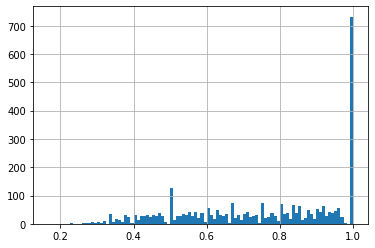

In [9]:
pooled_ad.obs['percentage'].hist(bins = 100)

<AxesSubplot:>

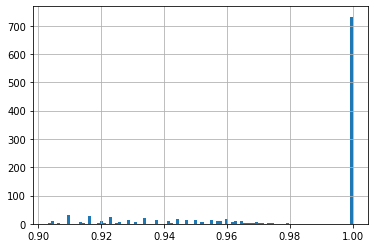

In [10]:
pooled_ad.obs['percentage'][pooled_ad.obs['percentage']>0.9].hist(bins = 100)

In [11]:
pooled_ad.var.head(3)

""
10FTHF5GLUtl_pos
10FTHF5GLUtm_pos
10FTHF6GLUtl_pos


In [12]:
get_reaction_consistencies(pd.read_csv("/nfs/team205/heart/compass/fetal_allCM/out/reactions.tsv", sep="\t", index_col=0)).head(5)

,cluster_0,cluster_1,cluster_2,cluster_3,cluster_4,cluster_5,cluster_6,cluster_7,cluster_8,cluster_9,...,cluster_3227,cluster_3228,cluster_3229,cluster_3230,cluster_3231,cluster_3232,cluster_3233,cluster_3234,cluster_3235,cluster_3236
10FTHF5GLUtl_pos,3.581116,3.568594,3.589757,3.571774,3.567363,3.580919,3.578116,3.566972,3.559334,3.584349,...,3.603692,3.580858,3.550445,3.599799,3.574664,3.598644,3.529647,3.618714,3.600590,3.567578
10FTHF5GLUtm_pos,3.282311,3.278123,3.302537,3.303432,3.295321,3.279295,3.307563,3.298806,3.287117,3.316628,...,3.308296,3.268472,3.212751,3.286660,3.250084,3.274276,3.175198,3.308701,3.279104,3.250663
10FTHF6GLUtl_pos,3.354332,3.338827,3.365492,3.351990,3.338134,3.354071,3.356473,3.341766,3.331716,3.362957,...,3.383357,3.354585,3.315968,3.378793,3.346514,3.377341,3.289290,3.403075,3.379681,3.337632
10FTHF6GLUtm_pos,3.194900,3.191971,3.226985,3.226150,3.217415,3.192498,3.236524,3.220768,3.208295,3.242981,...,3.237109,3.198987,3.132359,3.217003,3.181242,3.211342,3.091788,3.245148,3.213520,3.178189
10FTHF7GLUtl_pos,3.247535,3.225909,3.269249,3.257495,3.242616,3.227746,3.263590,3.246324,3.234947,3.269796,...,3.273592,3.257900,3.194262,3.273145,3.235894,3.282965,3.156313,3.305156,3.272292,3.226157


In [13]:
# get reaction ID column
pooled_ad.var['metadata_r_id'] = ""
for r in pooled_ad.var.index:
    if r in reaction_metadata.index:
        pooled_ad.var.loc[r, 'metadata_r_id'] = r
    elif r[:-4] in reaction_metadata.index:
        pooled_ad.var.loc[r, 'metadata_r_id'] = r[:-4]
    else:
        print("Should not occur")

In [14]:
pooled_ad.var=pooled_ad.var.merge(reaction_metadata, how='left',
                         left_on='metadata_r_id', right_index=True, validate='m:1')

In [15]:
pooled_ad.var

,metadata_r_id,reaction_name,formula,associated_genes,subsystem,EC_number,confidence
10FTHF5GLUtl_pos,10FTHF5GLUtl,"5-glutamyl-10FTHF transport, lysosomal",1.00 * 10-formyltetrahydrofolate-[Glu](5) [c] ...,NaN,"Transport, lysosomal",NaN,2.0
10FTHF5GLUtm_pos,10FTHF5GLUtm,"5-glutamyl-10FTHF transport, mitochondrial",1.00 * 10-formyltetrahydrofolate-[Glu](5) [m] ...,NaN,"Transport, mitochondrial",NaN,2.0
10FTHF6GLUtl_pos,10FTHF6GLUtl,"6-glutamyl-10FTHF transport, lysosomal",1.00 * 10-formyltetrahydrofolate-[Glu](6) [c] ...,NaN,"Transport, lysosomal",NaN,2.0
10FTHF6GLUtm_pos,10FTHF6GLUtm,"6-glutamyl-10FTHF transport, mitochondrial",1.00 * 10-formyltetrahydrofolate-[Glu](6) [m] ...,NaN,"Transport, mitochondrial",NaN,2.0
10FTHF7GLUtl_pos,10FTHF7GLUtl,"7-glutamyl-10FTHF transport, lysosomal",1.00 * 10-formyltetrahydrofolate-[Glu](7) [c] ...,NaN,"Transport, lysosomal",NaN,2.0
...,...,...,...,...,...,...,...
sink_decdicoa(c)_neg,sink_decdicoa(c),"Sink for 2,6-dodecadienoylcoa(c)",1.00 * decadienoylcoa [c] --> ϕ\nNo genes,NaN,Fatty acid oxidation,NaN,NaN
sink_octdececoa(c)_neg,sink_octdececoa(c),OCTDECECOASINK,1.00 * octadecenoylcoa [c] --> ϕ\nNo genes,NaN,Fatty acid oxidation,NaN,NaN
sink_pre_prot(r)_neg,sink_pre_prot(r),glycophosphatidylinositol (GPI)-anchored prote...,1.00 * glycophosphatidylinositol (GPI)-anchore...,NaN,Exchange/demand reaction,2.4.99.9,1.0
sink_tetdec2coa(c)_neg,sink_tetdec2coa(c),TETDEC2COASINK,1.00 * tetradecadienoylcoa [c] --> ϕ\nNo genes,NaN,Fatty acid oxidation,NaN,NaN


In [16]:
today = timestamp()
print(today)

20220928


In [17]:
pooled_ad.write(f"/nfs/team205/heart/compass/fetal_allCM/out/compass.anndata_converted.{today}.h5ad", compression="lzf")

# Process

In [18]:
pooled_ad0 = pooled_ad.copy()

## QC

In [19]:
sk.calculate_qc(pooled_ad0, flags={})

Distribution seems very different from nUMI

Let's take a closer look

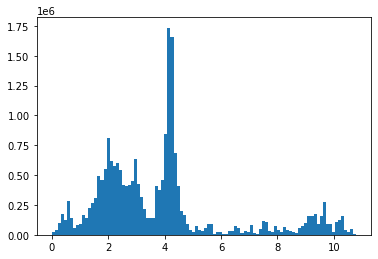

In [20]:
plt.hist(pooled_ad0.X.flatten(), 100);

Distribution very multi-modal

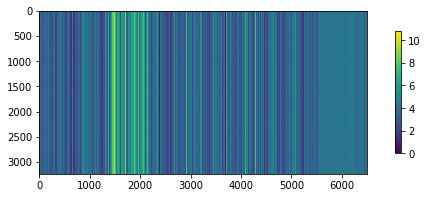

In [21]:
sk.set_figsize((10, 3))
plt.imshow(pooled_ad0.X)
plt.colorbar(shrink=0.75);

## Clustering by metabolic state: all clusters

In [22]:
pooled_ad1 = pooled_ad0.copy()

In [23]:
#log normalising
sc.pp.normalize_total(pooled_ad1, target_sum=1e4)
sc.pp.log1p(pooled_ad1)
pooled_ad1.raw = pooled_ad1

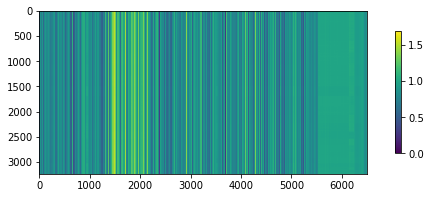

In [24]:
sk.set_figsize((10, 3))
plt.imshow(pooled_ad1.X)
plt.colorbar(shrink=0.75);

In [25]:
pooled_ad1.raw.X.sum(axis=1).min(), pooled_ad1.raw.X.sum(axis=1).max()

(5634.0664, 5678.153)

### highly variable features only

In [26]:
sc.pp.highly_variable_genes(pooled_ad1, subset=False)

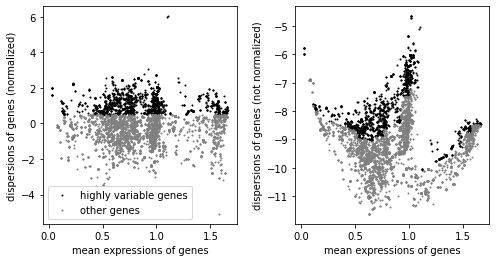

In [27]:
sk.set_figsize((4, 4))
sc.pl.highly_variable_genes(pooled_ad1)

In [28]:
sc.pp.scale(pooled_ad1, zero_center=True, max_value=10)

In [29]:
pooled_ad1a = pooled_ad1.copy()
sc.pp.pca(pooled_ad1a, use_highly_variable=True)
sc.pp.neighbors(pooled_ad1a, n_neighbors=10, n_pcs=14)
sc.tl.umap(pooled_ad1a, min_dist=0.1)

/home/jovyan/my-conda-envs/scanpy/lib/python3.9/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html


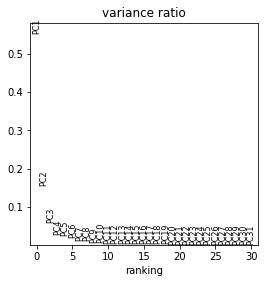

In [30]:
sc.pl.pca_variance_ratio(pooled_ad1a)

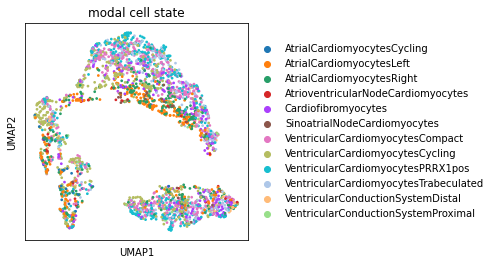

In [31]:
sc.pl.umap(pooled_ad1a, color=["modal cell state"], wspace=0.4, size=30)

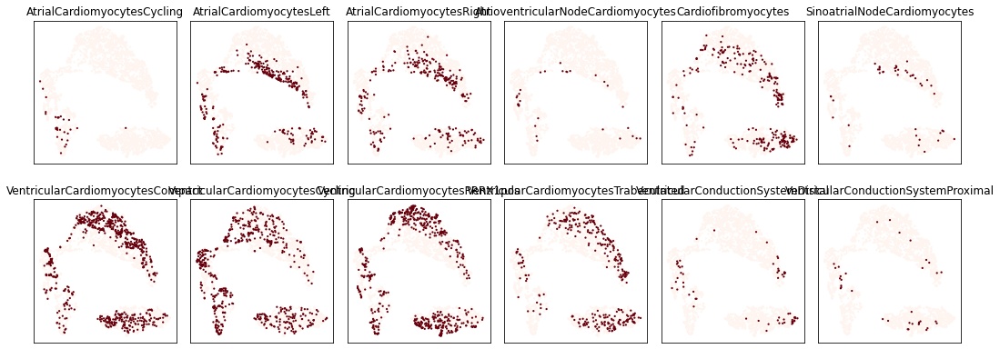

In [32]:
sk.highlight(
    pooled_ad1a, basis="umap", groupby="modal cell state", wspace=0, figsize=(3, 3), size=20, ncols=6
)

In [33]:
sc.tl.leiden(pooled_ad1a, resolution=0.1, key_added="leiden_0p1")

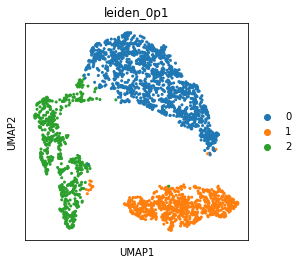

In [34]:
sk.set_figsize((4, 4))
sc.pl.umap(pooled_ad1a, color=["leiden_0p1"])

In [35]:
sc.tl.rank_genes_groups(pooled_ad1a, groupby="leiden_0p1", method="wilcoxon")

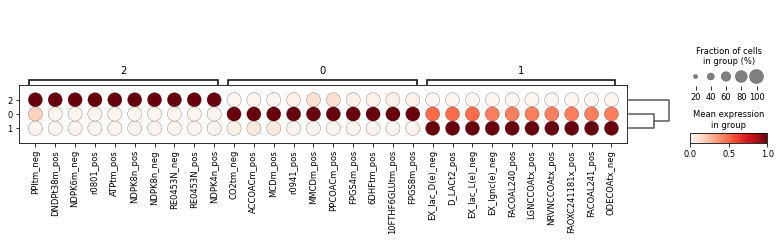

In [36]:
sc.pl.rank_genes_groups_dotplot(pooled_ad1a, groupby="leiden_0p1", standard_scale="var")

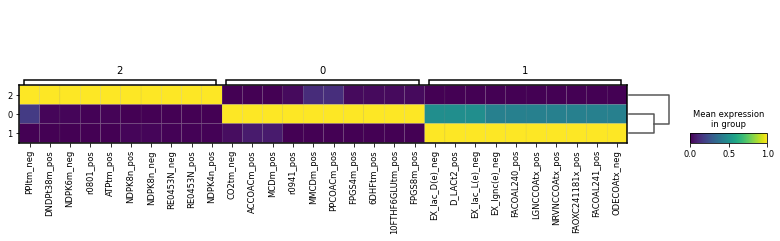

In [37]:
sc.pl.rank_genes_groups_matrixplot(pooled_ad1a, groupby="leiden_0p1", standard_scale="var")

### all features

In [164]:
pooled_ad1b = pooled_ad1.copy()
sc.pp.pca(pooled_ad1b, use_highly_variable=False)
sc.pp.neighbors(pooled_ad1b, n_neighbors=20, n_pcs=10)
sc.tl.umap(pooled_ad1b, min_dist=0.1)

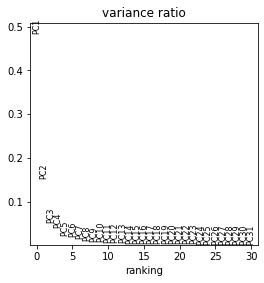

In [165]:
sc.pl.pca_variance_ratio(pooled_ad1b)

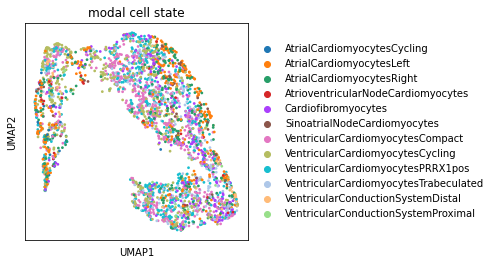

In [166]:
sc.pl.umap(pooled_ad1b, color=["modal cell state"], wspace=0.4, size=30)

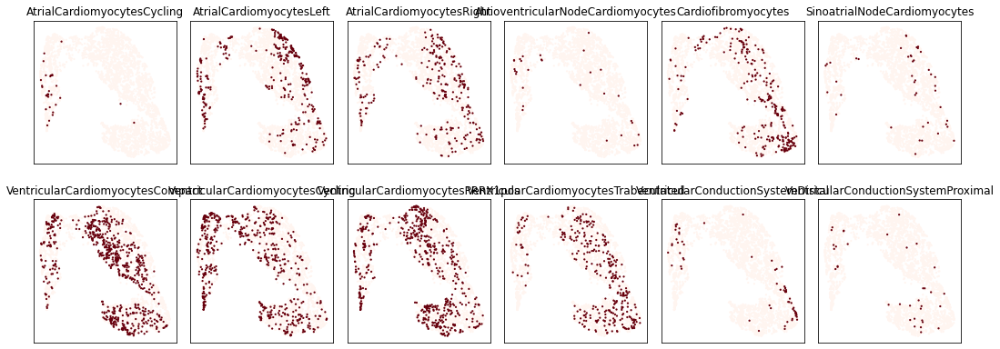

In [167]:
sk.highlight(
    pooled_ad1b, basis="umap", groupby="modal cell state", wspace=0, figsize=(3, 3), size=20, ncols=6
)

In [168]:
sc.tl.leiden(pooled_ad1b, resolution=0.1, key_added="leiden_0p1")

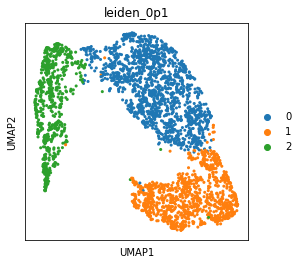

In [169]:
sk.set_figsize((4, 4))
sc.pl.umap(pooled_ad1b, color=["leiden_0p1"])

In [170]:
sc.tl.rank_genes_groups(pooled_ad1b, groupby="leiden_0p1", method="wilcoxon")

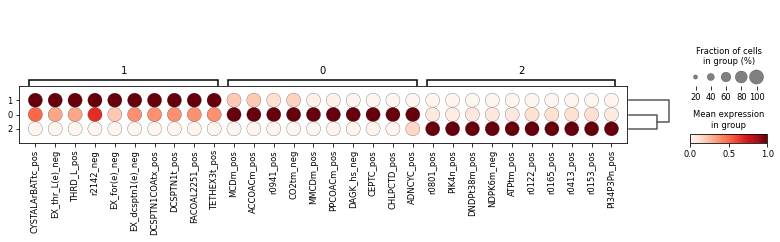

In [171]:
sc.pl.rank_genes_groups_dotplot(pooled_ad1b, groupby="leiden_0p1", standard_scale="var")

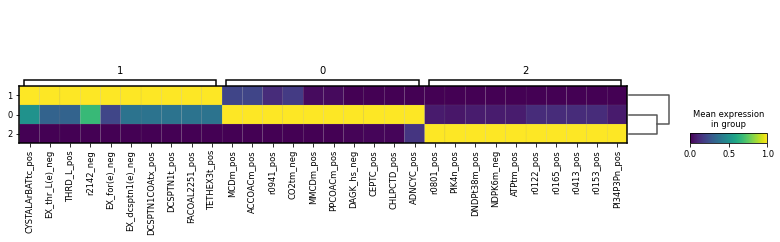

In [172]:
sc.pl.rank_genes_groups_matrixplot(pooled_ad1b, groupby="leiden_0p1", standard_scale="var")

## Clustering by metabolic state: only cell-state specific clusters

In [40]:
pooled_ad2 = pooled_ad0.copy()
print(pooled_ad2.shape)
pooled_ad2 = pooled_ad2[pooled_ad2.obs['percentage']>0.98] # keep only clusters where 98% of cells are of one cell state
print(pooled_ad2.shape)

(3237, 6508)
(732, 6508)


In [41]:
#log normalising
sc.pp.normalize_total(pooled_ad2, target_sum=1e4)
sc.pp.log1p(pooled_ad2)
pooled_ad2.raw = pooled_ad2

/home/jovyan/my-conda-envs/scanpy/lib/python3.9/site-packages/scanpy/preprocessing/_normalization.py:170: UserWarning: Received a view of an AnnData. Making a copy.


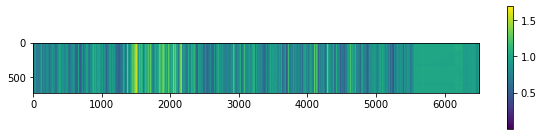

In [42]:
sk.set_figsize((10, 3))
plt.imshow(pooled_ad2.X)
plt.colorbar(shrink=0.75);

In [43]:
pooled_ad2.raw.X.sum(axis=1).min(), pooled_ad2.raw.X.sum(axis=1).max()

(5635.426, 5678.153)

### highly variable features only

In [44]:
sc.pp.highly_variable_genes(pooled_ad2, subset=False)

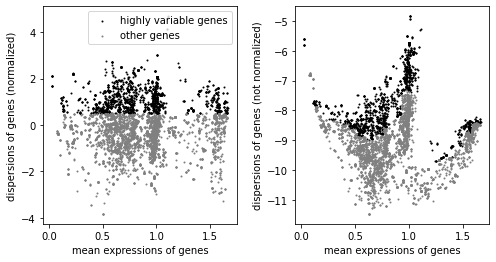

In [45]:
sk.set_figsize((4, 4))
sc.pl.highly_variable_genes(pooled_ad2)

In [46]:
sc.pp.scale(pooled_ad2, zero_center=True, max_value=10)

In [47]:
pooled_ad2a = pooled_ad2.copy()
sc.pp.pca(pooled_ad2a, use_highly_variable=True)
sc.pp.neighbors(pooled_ad2a, n_neighbors=10, n_pcs=14)
sc.tl.umap(pooled_ad2a, min_dist=0.1)

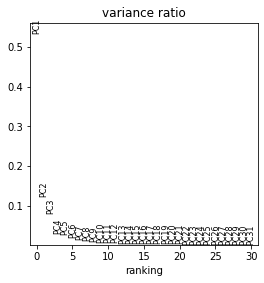

In [48]:
sc.pl.pca_variance_ratio(pooled_ad2a)

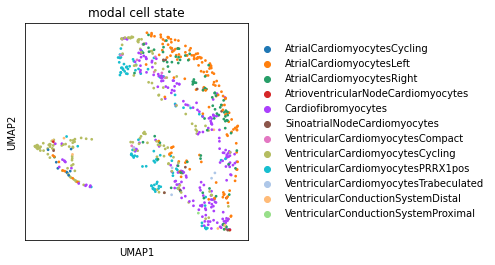

In [49]:
sc.pl.umap(pooled_ad2a, color=["modal cell state"], wspace=0.4, size=30)

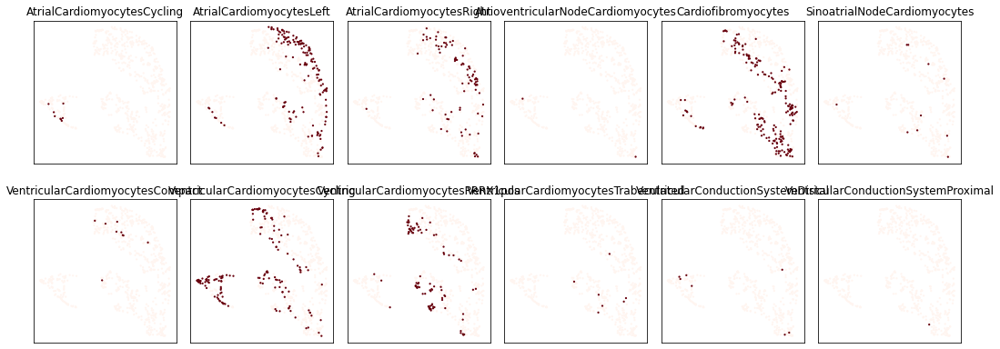

In [50]:
sk.highlight(
    pooled_ad2a, basis="umap", groupby="modal cell state", wspace=0, figsize=(3, 3), size=20, ncols=6
)

In [51]:
sc.tl.leiden(pooled_ad2a, resolution=0.1, key_added="leiden_0p1")

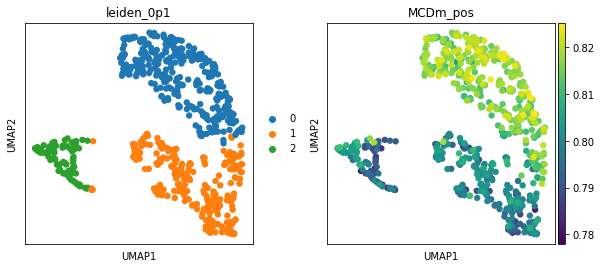

In [52]:
sk.set_figsize((4, 4))
sc.pl.umap(pooled_ad2a, color=["leiden_0p1","MCDm_pos"])

/home/jovyan/my-conda-envs/scanpy/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.


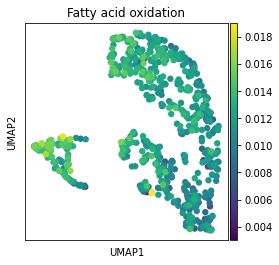

In [53]:
subsystem='Fatty acid oxidation'
sc.tl.score_genes(
    pooled_ad2a,
    pooled_ad2a.var.index[pooled_ad2a.var['subsystem']==subsystem].tolist(),
    score_name=subsystem
                 )

sc.pl.umap(pooled_ad2a, color=[subsystem])

In [54]:
sc.tl.rank_genes_groups(pooled_ad2a, groupby="leiden_0p1", method="wilcoxon")

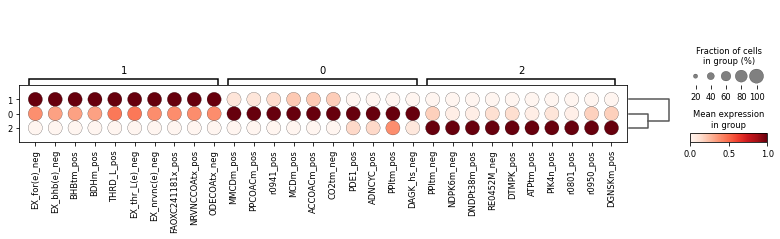

In [55]:
sc.pl.rank_genes_groups_dotplot(pooled_ad2a, groupby="leiden_0p1", standard_scale="var")

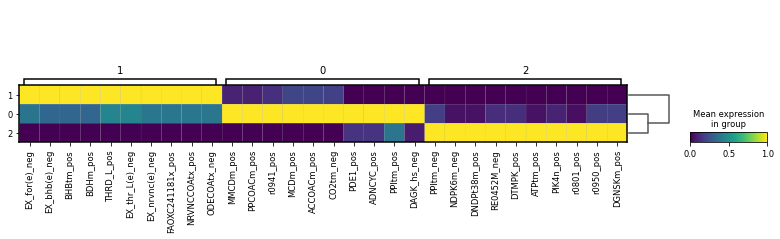

In [56]:
sc.pl.rank_genes_groups_matrixplot(pooled_ad2a, groupby="leiden_0p1", standard_scale="var")

[]

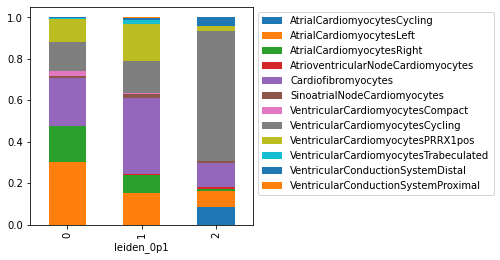

In [57]:
tmp = pd.crosstab(pooled_ad2a.obs['leiden_0p1'], pooled_ad2a.obs['modal cell state'], normalize='index')
# tmp.plot.bar().legend(loc=1)
ax = tmp.plot.bar(stacked=True)
ax.grid(False)
ax.legend(bbox_to_anchor=(1.0, 1.0))
ax.plot()

### all features

In [190]:
pooled_ad2b = pooled_ad2.copy()
sc.pp.pca(pooled_ad2b, use_highly_variable=False)
sc.pp.neighbors(pooled_ad2b, n_neighbors=20, n_pcs=10)
sc.tl.umap(pooled_ad2b, min_dist=0.1)

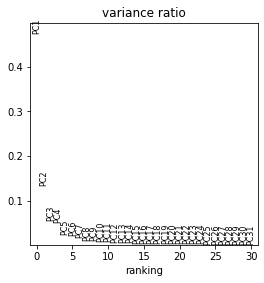

In [191]:
sc.pl.pca_variance_ratio(pooled_ad2b)

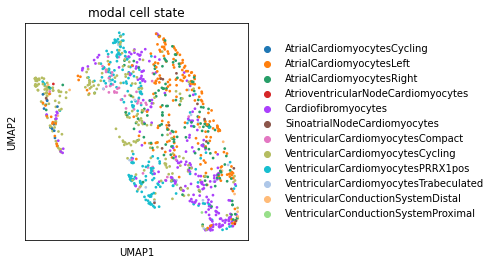

In [192]:
sc.pl.umap(pooled_ad2b, color=["modal cell state"], wspace=0.4, size=30)

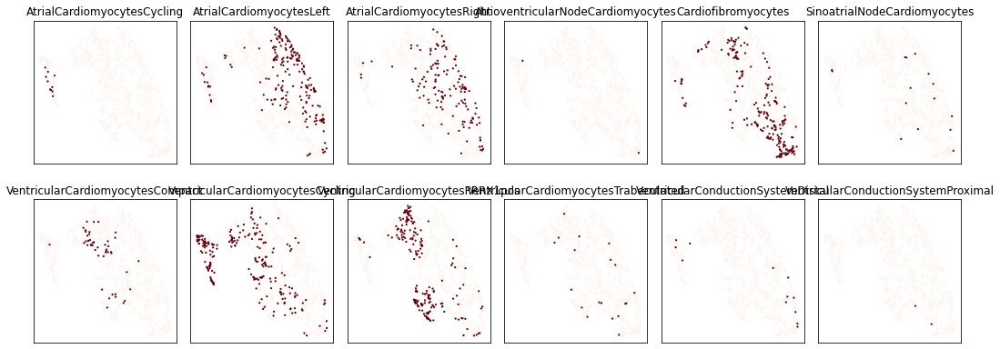

In [193]:
sk.highlight(
    pooled_ad2b, basis="umap", groupby="modal cell state", wspace=0, figsize=(3, 3), size=20, ncols=6
)

In [194]:
sc.tl.leiden(pooled_ad2b, resolution=0.1, key_added="leiden_0p1")

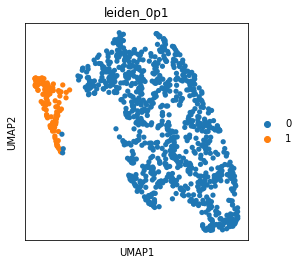

In [195]:
sk.set_figsize((4, 4))
sc.pl.umap(pooled_ad2b, color=["leiden_0p1"])

In [196]:
sc.tl.rank_genes_groups(pooled_ad2b, groupby="leiden_0p1", method="wilcoxon")

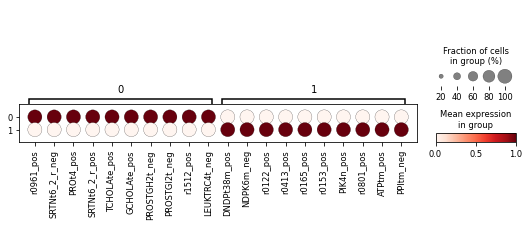

In [197]:
sc.pl.rank_genes_groups_dotplot(pooled_ad2b, groupby="leiden_0p1", standard_scale="var")

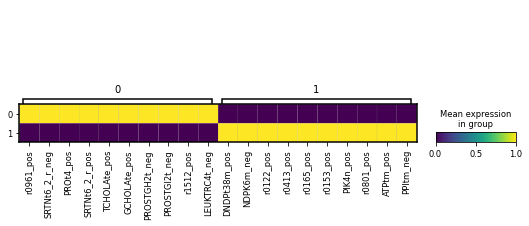

In [198]:
sc.pl.rank_genes_groups_matrixplot(pooled_ad2b, groupby="leiden_0p1", standard_scale="var")

[]

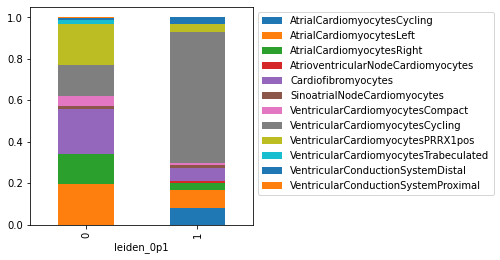

In [199]:
tmp = pd.crosstab(pooled_ad2b.obs['leiden_0p1'], pooled_ad2b.obs['modal cell state'], normalize='index')
# tmp.plot.bar().legend(loc=1)
ax = tmp.plot.bar(stacked=True)
ax.grid(False)
ax.legend(bbox_to_anchor=(1.0, 1.0))
ax.plot()

## Clustering by metabolic state: only cell-state specific clusters, with cycling cells removed

In [200]:
pooled_ad3 = pooled_ad0.copy()
print(pooled_ad3.shape)
pooled_ad3 = pooled_ad3[pooled_ad3.obs['percentage']>0.9] # keep only clusters where 90% of cells are of one cell state
print(pooled_ad3.shape)
pooled_ad3 = pooled_ad3[pooled_ad3.obs['modal cell state']!='AtrialCardiomyocytesCycling'] # keep only clusters where 90% of cells are of one cell state
print(pooled_ad3.shape)
pooled_ad3 = pooled_ad3[pooled_ad3.obs['modal cell state']!='VentricularCardiomyocytesCycling'] # keep only clusters where 90% of cells are of one cell state
print(pooled_ad3.shape)

(3237, 6508)
(1090, 6508)
(1080, 6508)
(855, 6508)


In [201]:
#log normalising
sc.pp.normalize_total(pooled_ad3, target_sum=1e4)
sc.pp.log1p(pooled_ad3)
pooled_ad3.raw = pooled_ad3

/home/jovyan/my-conda-envs/scanpy/lib/python3.9/site-packages/scanpy/preprocessing/_normalization.py:170: UserWarning: Received a view of an AnnData. Making a copy.


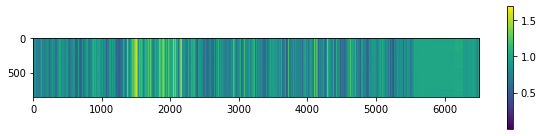

In [202]:
sk.set_figsize((10, 3))
plt.imshow(pooled_ad3.X)
plt.colorbar(shrink=0.75);

In [203]:
pooled_ad3.raw.X.sum(axis=1).min(), pooled_ad3.raw.X.sum(axis=1).max()

(5636.471, 5672.1787)

### highly variable features only

In [204]:
sc.pp.highly_variable_genes(pooled_ad3, subset=False)

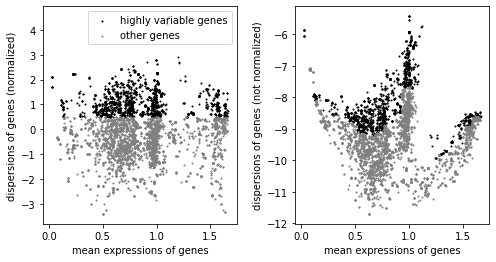

In [205]:
sk.set_figsize((4, 4))
sc.pl.highly_variable_genes(pooled_ad3)

In [206]:
sc.pp.scale(pooled_ad3, zero_center=True, max_value=10)

In [207]:
pooled_ad3a = pooled_ad3.copy()
sc.pp.pca(pooled_ad3a, use_highly_variable=True)
sc.pp.neighbors(pooled_ad3a, n_neighbors=10, n_pcs=14)
sc.tl.umap(pooled_ad3a, min_dist=0.1)

<AxesSubplot:>

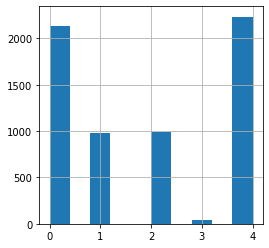

In [263]:
pooled_ad3a.var['confidence'].hist()

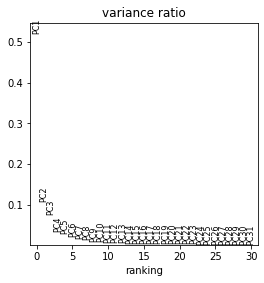

In [208]:
sc.pl.pca_variance_ratio(pooled_ad3a)

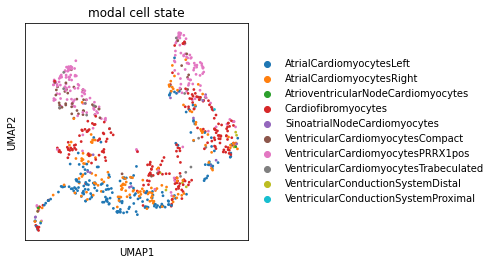

In [209]:
sc.pl.umap(pooled_ad3a, color=["modal cell state"], wspace=0.4, size=30)

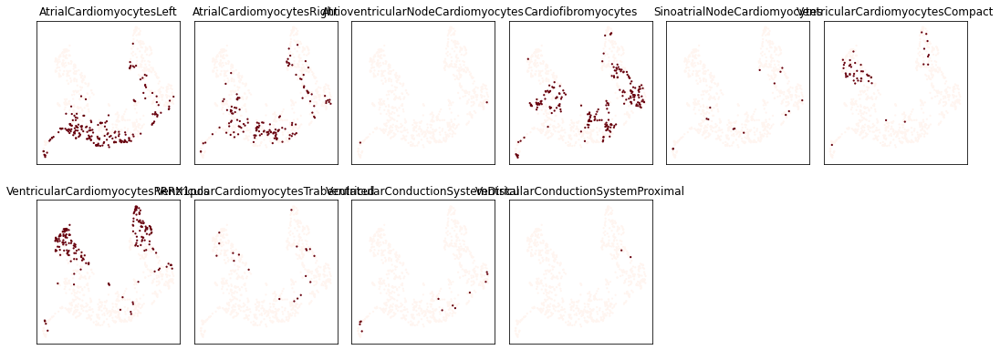

In [210]:
sk.highlight(
    pooled_ad3a, basis="umap", groupby="modal cell state", wspace=0, figsize=(3, 3), size=20, ncols=6
)

In [242]:
sc.tl.leiden(pooled_ad3a, resolution=0.1, key_added="leiden_0p1")

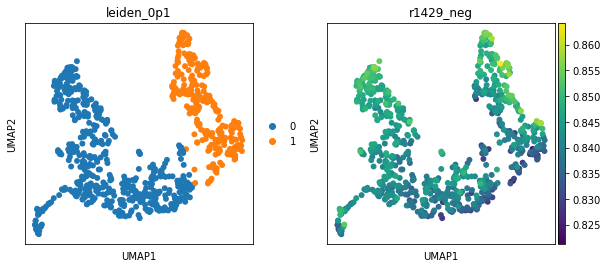

In [243]:
sk.set_figsize((4, 4))
sc.pl.umap(pooled_ad3a, color=["leiden_0p1","r1429_neg"])

In [245]:
pooled_ad3a.var['subsystem'].unique().tolist()

['Transport, lysosomal',
 'Transport, mitochondrial',
 'Transport, endoplasmic reticular',
 'beta-Alanine metabolism',
 'Transport, extracellular',
 'Lysine metabolism',
 'Transport, nuclear',
 'Vitamin D metabolism',
 'Glycine, serine, alanine and threonine metabolism',
 'Methionine and cysteine metabolism',
 'Pyrimidine catabolism',
 'Propanoate metabolism',
 'Fatty acid oxidation',
 'Tryptophan metabolism',
 'Tyrosine metabolism',
 'Ubiquinone synthesis',
 'Valine, leucine, and isoleucine metabolism',
 'Sphingolipid metabolism',
 'Butanoate metabolism',
 'Taurine and hypotaurine metabolism',
 'Arginine and Proline Metabolism',
 'Cytochrome metabolism',
 'Steroid metabolism',
 'Heme synthesis',
 'O-glycan synthesis',
 'Blood group synthesis',
 'Glutamate metabolism',
 'Pentose phosphate pathway',
 'Cholesterol metabolism',
 'Transport, peroxisomal',
 'Transport, golgi apparatus',
 'Aminosugar metabolism',
 'Phosphatidylinositol phosphate metabolism',
 'Glycerophospholipid metabolism'

In [238]:
sc.tl.score_genes(
    pooled_ad3a,
    pooled_ad3a.var.index[pooled_ad3a.var['subsystem']=='Transport, peroxisomal'].tolist(),
    score_name='Transport, peroxisomal'
                 )
sc.pl.umap(pooled_ad3a, color=["Glycolysis/gluconeogenesis"])

/home/jovyan/my-conda-envs/scanpy/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.


/home/jovyan/my-conda-envs/scanpy/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.


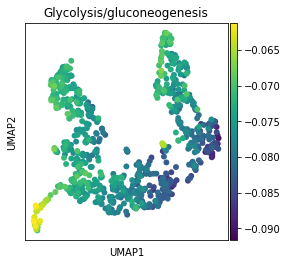

In [246]:
sc.tl.score_genes(
    pooled_ad3a,
    pooled_ad3a.var.index[pooled_ad3a.var['subsystem']=='Glycolysis/gluconeogenesis'].tolist(),
    score_name='Glycolysis/gluconeogenesis'
                 )

sc.pl.umap(pooled_ad3a, color=["Glycolysis/gluconeogenesis"])

/home/jovyan/my-conda-envs/scanpy/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.


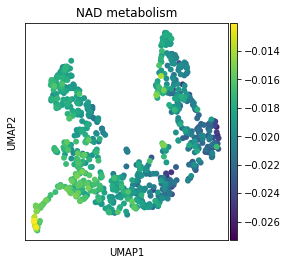

In [248]:
subsystem='NAD metabolism'
sc.tl.score_genes(
    pooled_ad3a,
    pooled_ad3a.var.index[pooled_ad3a.var['subsystem']==subsystem].tolist(),
    score_name=subsystem
                 )

sc.pl.umap(pooled_ad3a, color=[subsystem])

/home/jovyan/my-conda-envs/scanpy/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.


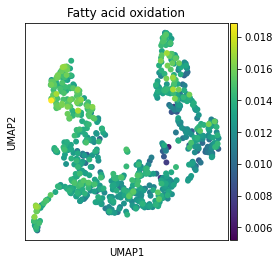

In [249]:
subsystem='Fatty acid oxidation'
sc.tl.score_genes(
    pooled_ad3a,
    pooled_ad3a.var.index[pooled_ad3a.var['subsystem']==subsystem].tolist(),
    score_name=subsystem
                 )

sc.pl.umap(pooled_ad3a, color=[subsystem])

/home/jovyan/my-conda-envs/scanpy/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.


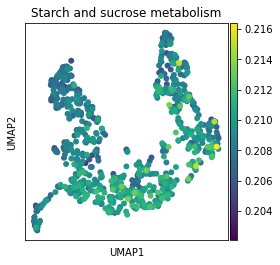

In [251]:
subsystem='Starch and sucrose metabolism'
sc.tl.score_genes(
    pooled_ad3a,
    pooled_ad3a.var.index[pooled_ad3a.var['subsystem']==subsystem].tolist(),
    score_name=subsystem
                 )

sc.pl.umap(pooled_ad3a, color=[subsystem])

In [213]:
sc.tl.rank_genes_groups(pooled_ad3a, groupby="leiden_0p5", method="wilcoxon")

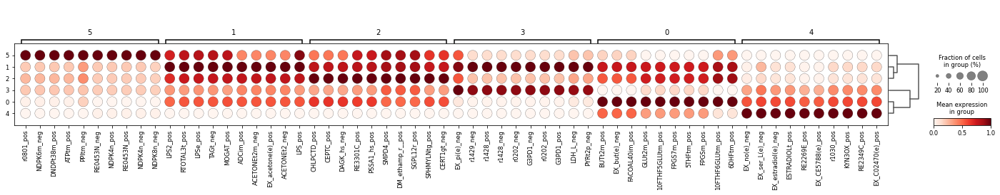

In [214]:
sc.pl.rank_genes_groups_dotplot(pooled_ad3a, groupby="leiden_0p5", standard_scale="var")

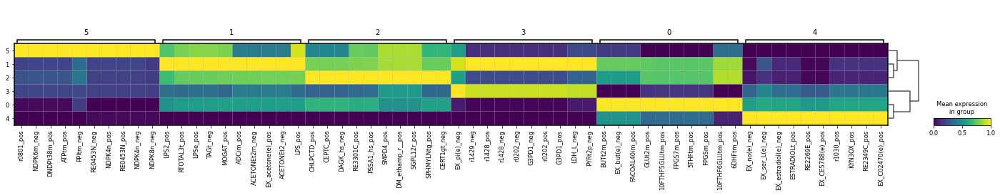

In [215]:
sc.pl.rank_genes_groups_matrixplot(pooled_ad3a, groupby="leiden_0p5", standard_scale="var")

[]

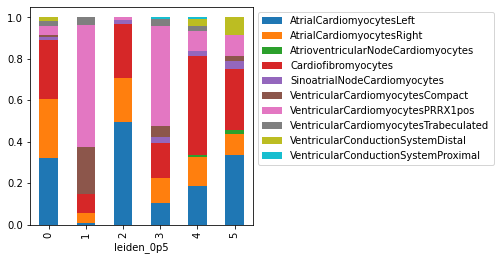

In [216]:
tmp = pd.crosstab(pooled_ad3a.obs['leiden_0p5'], pooled_ad3a.obs['modal cell state'], normalize='index')
# tmp.plot.bar().legend(loc=1)
ax = tmp.plot.bar(stacked=True)
ax.grid(False)
ax.legend(bbox_to_anchor=(1.0, 1.0))
ax.plot()

### all features

In [217]:
pooled_ad3b = pooled_ad3.copy()
sc.pp.pca(pooled_ad3b, use_highly_variable=False)
sc.pp.neighbors(pooled_ad3b, n_neighbors=20, n_pcs=10)
sc.tl.umap(pooled_ad3b, min_dist=0.1)

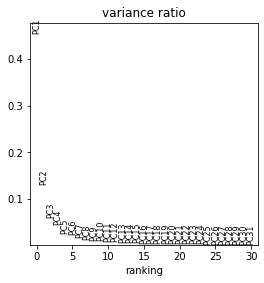

In [218]:
sc.pl.pca_variance_ratio(pooled_ad3b)

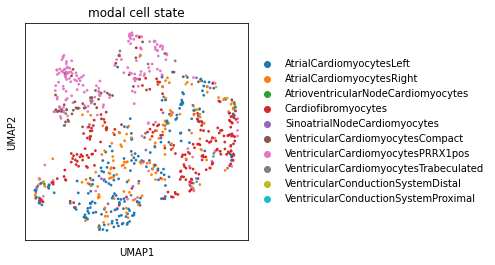

In [219]:
sc.pl.umap(pooled_ad3b, color=["modal cell state"], wspace=0.4, size=30)

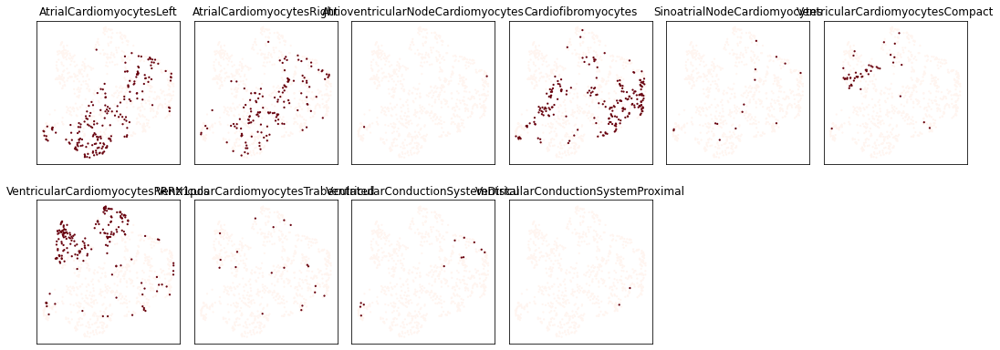

In [220]:
sk.highlight(
    pooled_ad3b, basis="umap", groupby="modal cell state", wspace=0, figsize=(3, 3), size=20, ncols=6
)

In [221]:
sc.tl.leiden(pooled_ad3b, resolution=0.2, key_added="leiden_0p2")

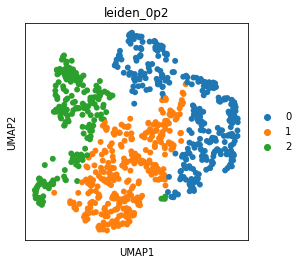

In [222]:
sk.set_figsize((4, 4))
sc.pl.umap(pooled_ad3b, color=["leiden_0p2"])

In [223]:
sc.tl.rank_genes_groups(pooled_ad3b, groupby="leiden_0p2", method="wilcoxon")

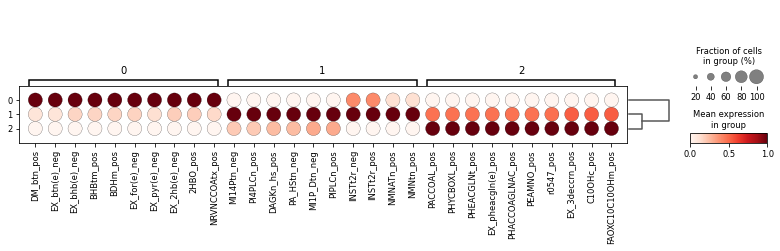

In [224]:
sc.pl.rank_genes_groups_dotplot(pooled_ad3b, groupby="leiden_0p2", standard_scale="var")

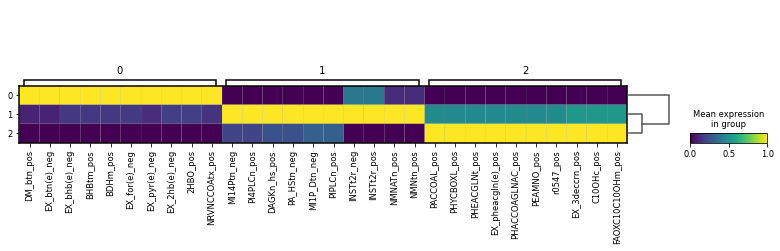

In [225]:
sc.pl.rank_genes_groups_matrixplot(pooled_ad3b, groupby="leiden_0p2", standard_scale="var")

[]

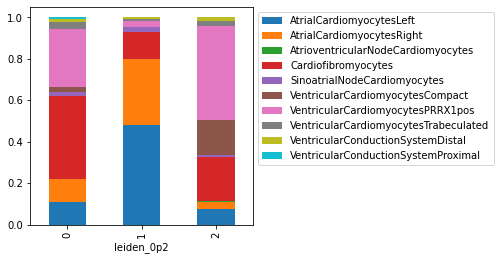

In [226]:
tmp = pd.crosstab(pooled_ad3b.obs['leiden_0p2'], pooled_ad3b.obs['modal cell state'], normalize='index')
# tmp.plot.bar().legend(loc=1)
ax = tmp.plot.bar(stacked=True)
ax.grid(False)
ax.legend(bbox_to_anchor=(1.0, 1.0))
ax.plot()

## Clustering by metabolic state: only cell-state specific clusters and only use confidence 4 and 0 reactions in clustering

In [74]:
pooled_ad4 = pooled_ad0.copy()
print(pooled_ad4.shape)
pooled_ad4 = pooled_ad4[pooled_ad4.obs['percentage']>0.98] # keep only clusters where 98% of cells are of one cell state
print(pooled_ad4.shape)

(3237, 6508)
(732, 6508)


In [75]:
#log normalising
sc.pp.normalize_total(pooled_ad4, target_sum=1e4)
sc.pp.log1p(pooled_ad4)
pooled_ad4.raw = pooled_ad4

/home/jovyan/my-conda-envs/scanpy/lib/python3.9/site-packages/scanpy/preprocessing/_normalization.py:170: UserWarning: Received a view of an AnnData. Making a copy.


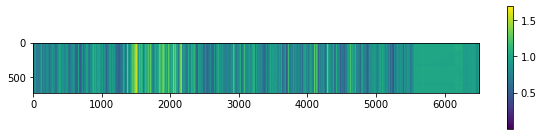

In [76]:
sk.set_figsize((10, 3))
plt.imshow(pooled_ad4.X)
plt.colorbar(shrink=0.75);

In [77]:
pooled_ad4.raw.X.sum(axis=1).min(), pooled_ad4.raw.X.sum(axis=1).max()

(5635.426, 5678.153)

### highly variable features only (using confidence 0 and 4 as HV proxies)

In [78]:
sk.set_figsize((4, 4))
pooled_ad4.var['highly_variable'] = False # reset everything
pooled_ad4.var['highly_variable'][pooled_ad4.var['confidence'].isin([4])]=True
#sc.pl.highly_variable_genes(pooled_ad4)

/tmp/ipykernel_33572/2000692542.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [79]:
sc.pp.scale(pooled_ad4, zero_center=True, max_value=10)

In [80]:
pooled_ad4 = pooled_ad4.copy()
sc.pp.pca(pooled_ad4, use_highly_variable=True)
sc.pp.neighbors(pooled_ad4, n_neighbors=10, n_pcs=14)
sc.tl.umap(pooled_ad4, min_dist=0.1)

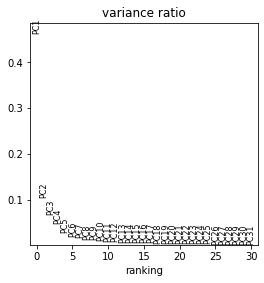

In [81]:
sc.pl.pca_variance_ratio(pooled_ad4)

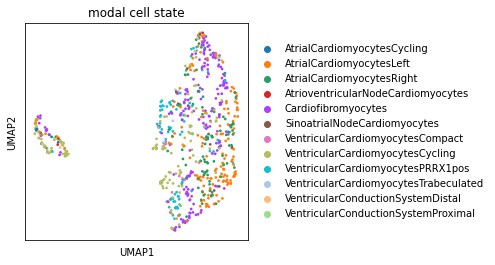

In [82]:
sc.pl.umap(pooled_ad4, color=["modal cell state"], wspace=0.4, size=30)

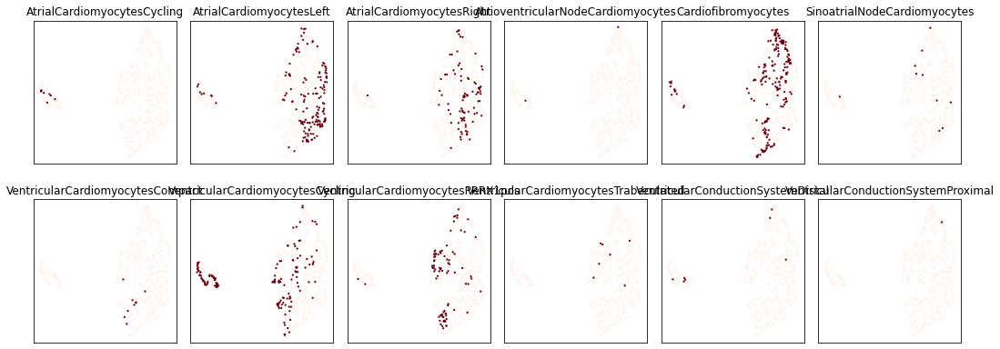

In [86]:
sk.highlight(
    pooled_ad4, basis="umap", groupby="modal cell state", wspace=0, figsize=(3, 3), size=20, ncols=6
)

In [89]:
sc.tl.leiden(pooled_ad4, resolution=0.1, key_added="leiden_0p1")

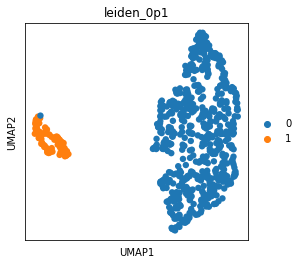

In [91]:
sk.set_figsize((4, 4))
sc.pl.umap(pooled_ad4, color=["leiden_0p1"])

In [92]:
sc.tl.rank_genes_groups(pooled_ad4, groupby="leiden_0p1", method="wilcoxon")

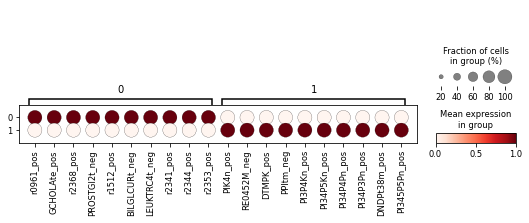

In [93]:
sc.pl.rank_genes_groups_dotplot(pooled_ad4, groupby="leiden_0p1", standard_scale="var")

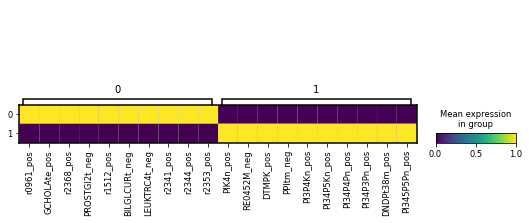

In [94]:
sc.pl.rank_genes_groups_matrixplot(pooled_ad4, groupby="leiden_0p1", standard_scale="var")

[]

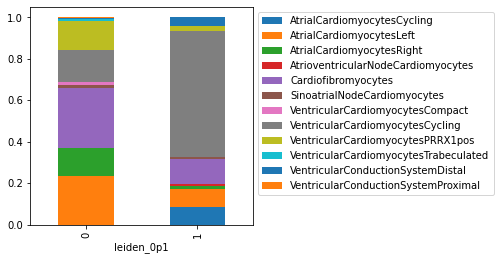

In [98]:
tmp = pd.crosstab(pooled_ad4.obs['leiden_0p1'], pooled_ad4.obs['modal cell state'], normalize='index')
# tmp.plot.bar().legend(loc=1)
ax = tmp.plot.bar(stacked=True)
ax.grid(False)
ax.legend(bbox_to_anchor=(1.0, 1.0))
ax.plot()

/home/jovyan/my-conda-envs/scanpy/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.


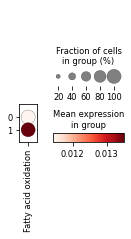

In [101]:
subsystem='Fatty acid oxidation'
sc.tl.score_genes(
    pooled_ad4,
    pooled_ad4.var.index[pooled_ad4.var['subsystem']==subsystem].tolist(),
    score_name=subsystem
                 )

In [102]:
subsystem_list=[]
for subsystem in pooled_ad4.var['subsystem'].unique().tolist():
    sc.tl.score_genes(
        pooled_ad4,
        pooled_ad4.var.index[pooled_ad4.var['subsystem']==subsystem].tolist(),
        score_name=subsystem
                 )
    subsystem_list.append(subsystem)

/home/jovyan/my-conda-envs/scanpy/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
/home/jovyan/my-conda-envs/scanpy/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
/home/jovyan/my-conda-envs/scanpy/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
/home/jovyan/my-conda-envs/scanpy/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
/home/jovyan/my-conda-envs/scanpy/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will ra

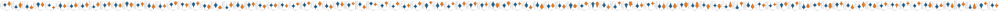

In [131]:
sc.pl.violin(pooled_ad4,
              keys=subsystem_list,
              groupby='leiden_0p1',
                 standard_scale='var',
             dendrogram=True)

/home/jovyan/my-conda-envs/scanpy/lib/python3.9/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.


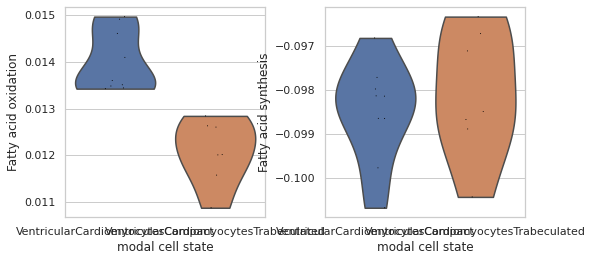

In [153]:
tmp=pooled_ad4[pooled_ad4.obs['modal cell state'].isin(['VentricularCardiomyocytesTrabeculated','VentricularCardiomyocytesCompact'])]
sc.pl.violin(tmp,
              keys=['Fatty acid oxidation','Fatty acid synthesis'],
              groupby='modal cell state')

/home/jovyan/my-conda-envs/scanpy/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
/home/jovyan/my-conda-envs/scanpy/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
/home/jovyan/my-conda-envs/scanpy/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
/home/jovyan/my-conda-envs/scanpy/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
/home/jovyan/my-conda-envs/scanpy/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will ra

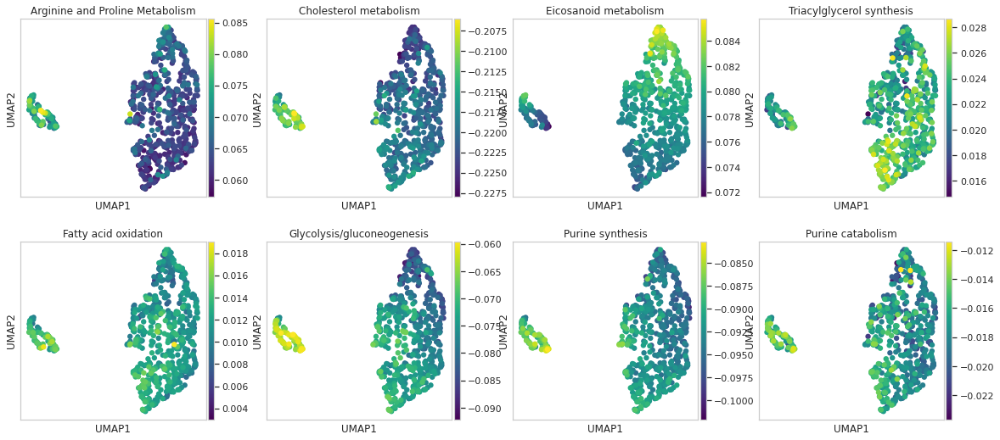

In [149]:
subsystems=['Arginine and Proline Metabolism','Cholesterol metabolism','Eicosanoid metabolism','Triacylglycerol synthesis','Fatty acid oxidation','Glycolysis/gluconeogenesis','Purine synthesis','Purine catabolism']
for subsystem in subsystems:
    sc.tl.score_genes(
        pooled_ad4,
        pooled_ad4.var.index[pooled_ad4.var['subsystem']==subsystem].tolist(),
        score_name=subsystem
    )

sc.pl.umap(pooled_ad4, color=subsystems,cmap='viridis')

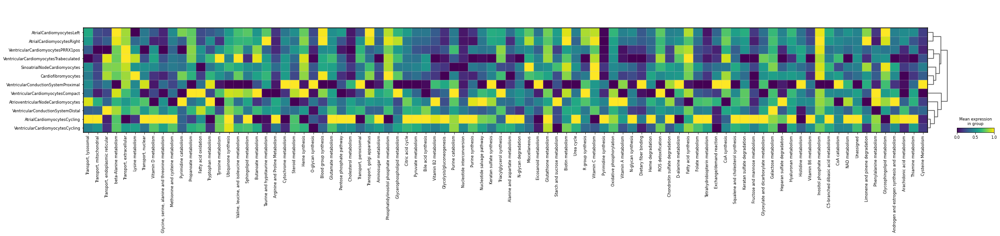

In [124]:
sc.pl.matrixplot(pooled_ad4,
              var_names=subsystem_list,
              groupby='modal cell state',
                 standard_scale='var',
             dendrogram=True)

## Clustering by metabolic state: only cell-state specific clusters; only use confidence 4 and 0 reactions in clustering; cycling cells removed

In [163]:
pooled_ad5 = pooled_ad0.copy()
print(pooled_ad5.shape)
pooled_ad5 = pooled_ad5[pooled_ad5.obs['percentage']>0.98] # keep only clusters where 98% of cells are of one cell state
print(pooled_ad5.shape)

(3237, 6508)
(732, 6508)


In [164]:
print(pooled_ad5.shape)
pooled_ad5 = pooled_ad5[pooled_ad5.obs['modal cell state']!='VentricularCardiomyocytesCycling']
print(pooled_ad5.shape)
pooled_ad5 = pooled_ad5[pooled_ad5.obs['modal cell state']!='AtrialCardiomyocytesCycling']
print(pooled_ad5.shape)

(732, 6508)
(579, 6508)
(571, 6508)


In [165]:
#log normalising
sc.pp.normalize_total(pooled_ad5, target_sum=1e4)
sc.pp.log1p(pooled_ad5)
pooled_ad5.raw = pooled_ad5

/home/jovyan/my-conda-envs/scanpy/lib/python3.9/site-packages/scanpy/preprocessing/_normalization.py:170: UserWarning: Received a view of an AnnData. Making a copy.


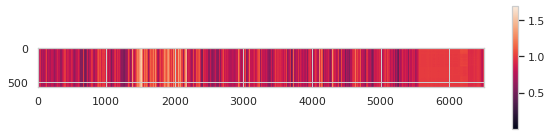

In [166]:
sk.set_figsize((10, 3))
plt.imshow(pooled_ad5.X)
plt.colorbar(shrink=0.75);

In [167]:
pooled_ad5.raw.X.sum(axis=1).min(), pooled_ad5.raw.X.sum(axis=1).max()

(5636.471, 5672.1787)

### highly variable features only (using confidence 0 and 4 as HV proxies)

In [168]:
sk.set_figsize((4, 4))
pooled_ad5.var['highly_variable'] = False # reset everything
pooled_ad5.var['highly_variable'][pooled_ad5.var['confidence'].isin([4])]=True
#sc.pl.highly_variable_genes(pooled_ad4)

/tmp/ipykernel_33572/523115111.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [169]:
sc.pp.scale(pooled_ad5, zero_center=True, max_value=10)

In [170]:
pooled_ad5 = pooled_ad5.copy()
sc.pp.pca(pooled_ad5, use_highly_variable=True)
sc.pp.neighbors(pooled_ad5, n_neighbors=10, n_pcs=14)
sc.tl.umap(pooled_ad5, min_dist=0.1)

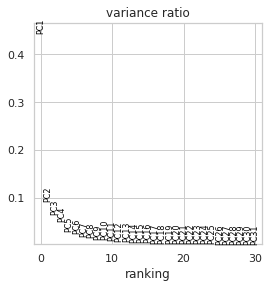

In [171]:
sc.pl.pca_variance_ratio(pooled_ad5)

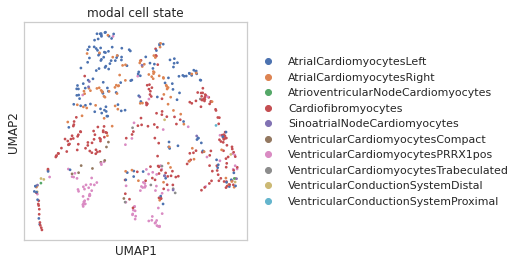

In [172]:
sc.pl.umap(pooled_ad5, color=["modal cell state"], wspace=0.4, size=30)

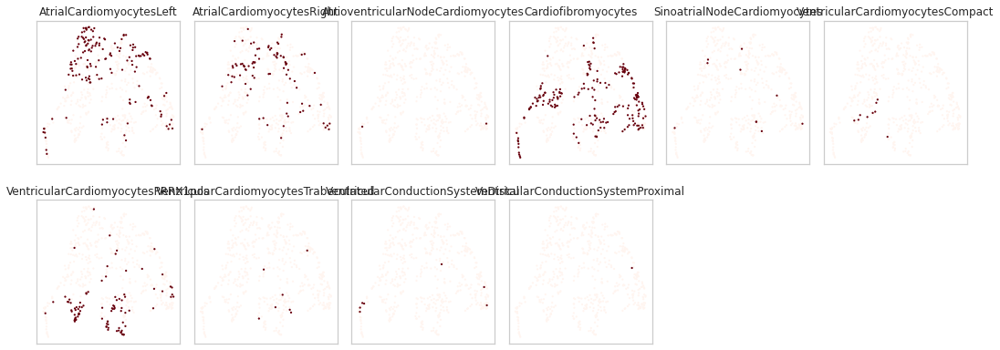

In [173]:
sk.highlight(
    pooled_ad5, basis="umap", groupby="modal cell state", wspace=0, figsize=(3, 3), size=20, ncols=6
)

In [176]:
sc.tl.leiden(pooled_ad5, resolution=0.2, key_added="leiden_0p2")

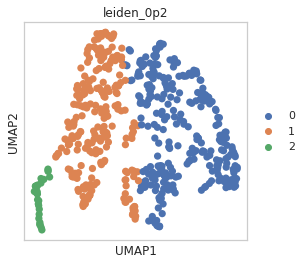

In [177]:
sk.set_figsize((4, 4))
sc.pl.umap(pooled_ad5, color=["leiden_0p2"])

In [178]:
sc.tl.rank_genes_groups(pooled_ad5, groupby="leiden_0p2", method="wilcoxon")

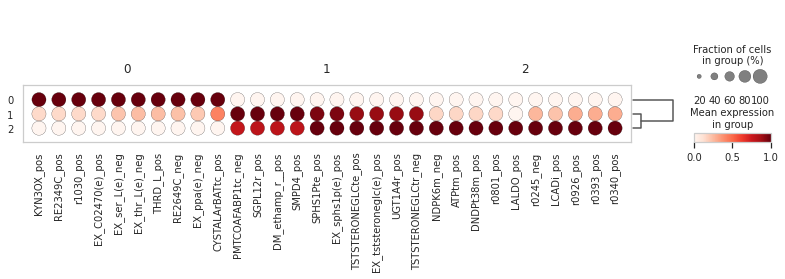

In [179]:
sc.pl.rank_genes_groups_dotplot(pooled_ad5, groupby="leiden_0p2", standard_scale="var")

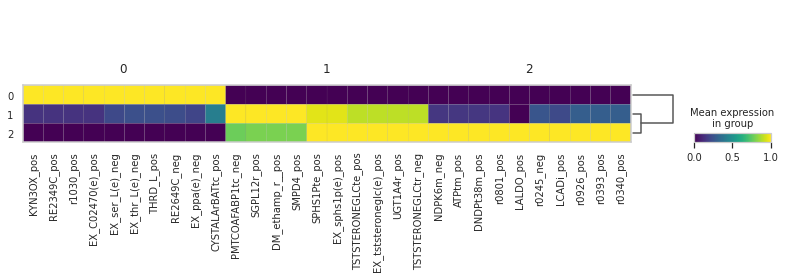

In [180]:
sc.pl.rank_genes_groups_matrixplot(pooled_ad5, groupby="leiden_0p2", standard_scale="var")

[]

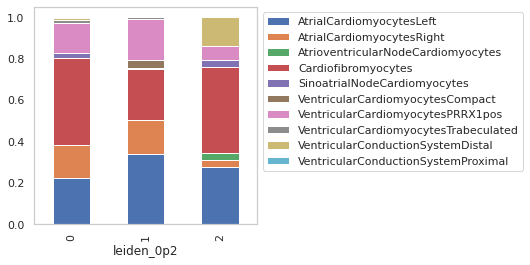

In [181]:
tmp = pd.crosstab(pooled_ad5.obs['leiden_0p2'], pooled_ad5.obs['modal cell state'], normalize='index')
# tmp.plot.bar().legend(loc=1)
ax = tmp.plot.bar(stacked=True)
ax.grid(False)
ax.legend(bbox_to_anchor=(1.0, 1.0))
ax.plot()

In [183]:
subsystem_list=[]
for subsystem in pooled_ad5.var['subsystem'].unique().tolist():
    sc.tl.score_genes(
        pooled_ad5,
        pooled_ad5.var.index[pooled_ad5.var['subsystem']==subsystem].tolist(),
        score_name=subsystem
                 )
    subsystem_list.append(subsystem)

/home/jovyan/my-conda-envs/scanpy/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
/home/jovyan/my-conda-envs/scanpy/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
/home/jovyan/my-conda-envs/scanpy/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
/home/jovyan/my-conda-envs/scanpy/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
/home/jovyan/my-conda-envs/scanpy/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will ra

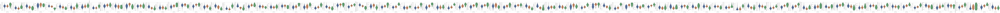

In [185]:
sc.pl.violin(pooled_ad5,
              keys=subsystem_list,
              groupby='leiden_0p2',
                 standard_scale='var',
             dendrogram=True)

/home/jovyan/my-conda-envs/scanpy/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
/home/jovyan/my-conda-envs/scanpy/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
/home/jovyan/my-conda-envs/scanpy/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
/home/jovyan/my-conda-envs/scanpy/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
/home/jovyan/my-conda-envs/scanpy/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will ra

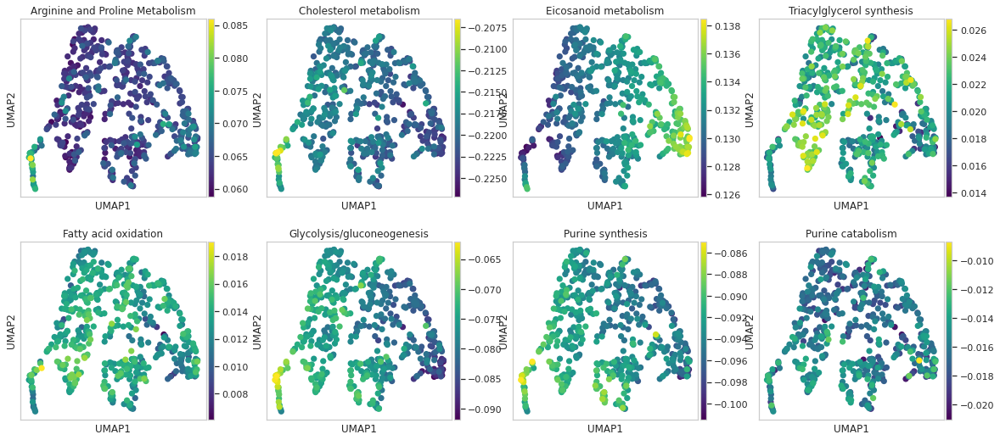

In [203]:
subsystems=['Arginine and Proline Metabolism','Cholesterol metabolism','Eicosanoid metabolism','Triacylglycerol synthesis','Fatty acid oxidation','Glycolysis/gluconeogenesis','Purine synthesis','Purine catabolism']
for subsystem in subsystems:
    sc.tl.score_genes(
        pooled_ad5,
        pooled_ad5.var.index[pooled_ad5.var['subsystem']==subsystem].tolist(),
        score_name=subsystem
    )

sc.pl.umap(pooled_ad5, color=subsystems,cmap='viridis')

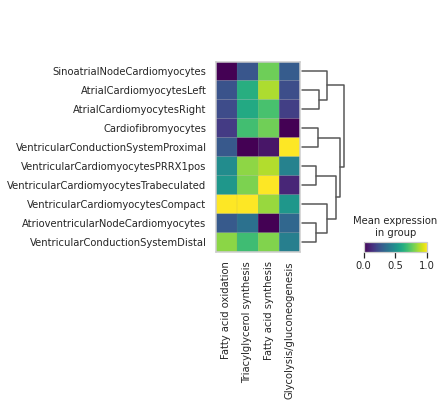

In [198]:
sc.pl.matrixplot(pooled_ad5,
              var_names=['Fatty acid oxidation','Triacylglycerol synthesis','Fatty acid synthesis','Glycolysis/gluconeogenesis'],
              groupby='modal cell state',
                 standard_scale='var',
             dendrogram=True)